# Dataset

In [1]:
!pip install opendatasets --upgrade --quiet

In [2]:
import opendatasets as od

In [3]:
dataset_url = 'https://www.kaggle.com/ikarus777/best-artworks-of-all-time'

In [4]:
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: rups2810
Your Kaggle Key: ··········


100%|██████████| 2.29G/2.29G [02:01<00:00, 20.3MB/s]


#Import the dataset into PyTorch



In [5]:
data_dir = '/content/best-artworks-of-all-time/resized/'

In [6]:
import os

In [7]:
for cls in os.listdir(data_dir):
  print(cls, ':', len(os.listdir(data_dir + '/' + cls)))

resized : 8683


In [8]:
from torchvision.datasets import ImageFolder

In [9]:
dataset = ImageFolder(data_dir)

In [10]:
len(dataset)

8683

In [11]:
import matplotlib.pyplot as plt
%matplotlib inline

#Visualise dataset.

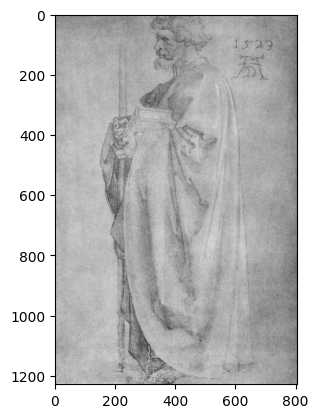

In [20]:
img, label = dataset[28]
plt.imshow(img)

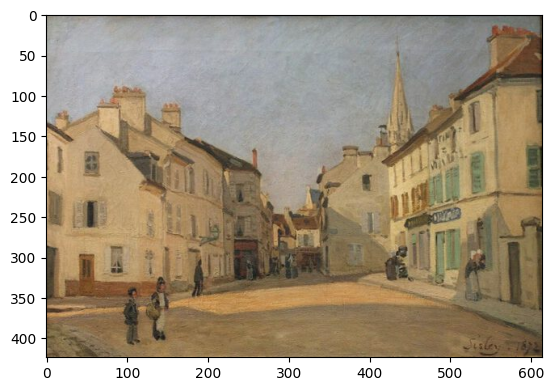

In [19]:
img, label = dataset[700]
plt.imshow(img)

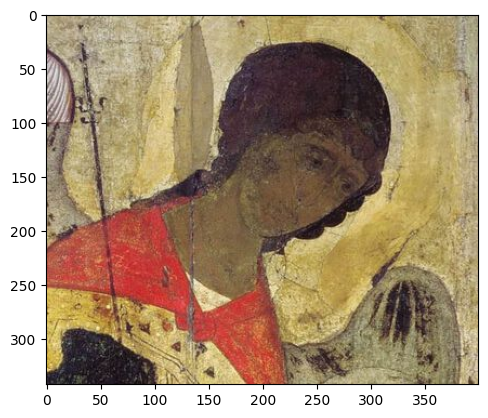

In [18]:
img, label = dataset[1200]
plt.imshow(img)

#Making batches of picture:

1.   First resize and center crop all images to ensure that they are all in same shape and size.

2. Then convert them to tensors and normalize them.
3. Then create the data loader.
4. Then look at some samples.



In [21]:
import torchvision.transforms as tt
from torch.utils.data import DataLoader

In [22]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [23]:
train_ds = ImageFolder(data_dir, transform=tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.ToTensor(),
    tt.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [24]:
from torchvision.utils import make_grid

In [25]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [26]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


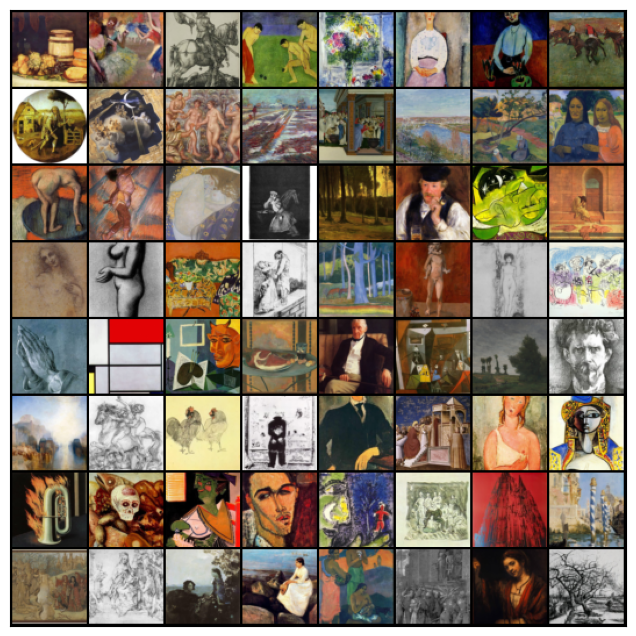

In [27]:
show_batch(train_dl)

#Using a GPU
To seamlessly use a GPU, if one is available, we define a couple of helper functions (get_default_device & to_device) and a helper class "DeviceDataLoader" to move our model & data to the GPU, if one is available.

In [28]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [29]:
import torch

In [30]:
device = get_default_device()
device

device(type='cuda')

In [31]:
train_dl = DeviceDataLoader(train_dl, device)

# Build Discriminator Network
The discriminator takes  image as an input, and tries to classify it as "real" or "generated". In this sense, it's like any other neural network. We'll use a convolutional neural networks (CNN) which outputs a single number output for every image. We'll use stride of 2 to progressively reduce the size of the output feature map.

In [32]:
import torch.nn as nn

In [33]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [34]:
discriminator = to_device(discriminator, device)

#Build Generator Network
The input to the generator is typically a vector or a matrix of random numbers (referred to as a latent tensor) which is used as a seed for generating an image. The generator will convert a latent tensor of shape (128, 1, 1) into an image tensor of shape 3 x 28 x 28. To achive this, we'll use the ConvTranspose2d layer from PyTorch, which is performs to as a transposed convolution (also referred to as a deconvolution)

In [35]:
latent_size = 128

In [36]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

#Let's see how our first generative image look's like .

torch.Size([128, 3, 64, 64])


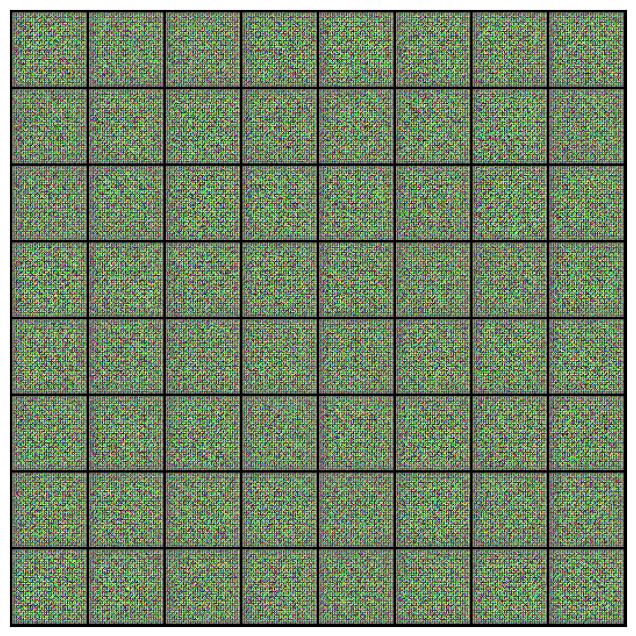

In [37]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

It seems like it's really poor.So for that now we have to train our model.

In [38]:
generator = to_device(generator, device)

#Discriminator Training
Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.

###Here are the steps involved in training the discriminator.

1. We expect the discriminator to output 1 if the image was picked from the real MNIST dataset, and 0 if it was generated using the generator network.

2. We first pass a batch of real images, and compute the loss, setting the target labels to 1.

3. Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0.

4. Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.

It's important to note that we don't change the weights of the generator model while training the discriminator (opt_d only affects the discriminator.parameters())

In [39]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

#Generator Training
Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we employ a rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:

1. We generate a batch of images using the generator, pass it into the discriminator.

2. We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator.

3. We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

In [40]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [41]:
from torchvision.utils import save_image

In [42]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [43]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [44]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


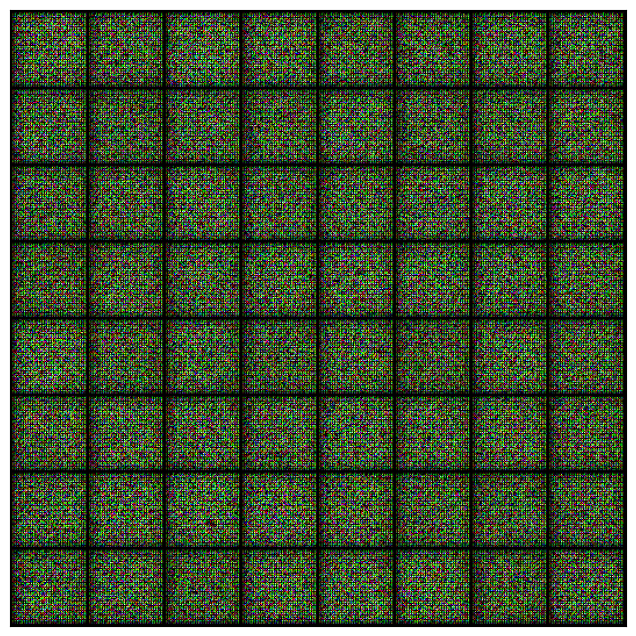

In [45]:
save_samples(0, fixed_latent)


## Full Training Loop

Let's define a fit function to train the discriminator and generator in tandem for each batch of training data. We'll use the Adam optimizer with some custom parameters (betas) that are known to work well for GANs. We will also save some sample generated images at regular intervals for inspection.

<img src="https://i.imgur.com/6NMdO9u.png" style="max-width:420px; margin-bottom:32px"/>


In [46]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [47]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [48]:
lr = 0.0001
epochs = 100

In [49]:
history = fit(epochs, lr)

  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 7.4522, loss_d: 0.0836, real_score: 0.9650, fake_score: 0.0460
Saving generated-images-0001.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 5.4754, loss_d: 0.1540, real_score: 0.9663, fake_score: 0.1080
Saving generated-images-0002.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 4.1753, loss_d: 0.1144, real_score: 0.9467, fake_score: 0.0541
Saving generated-images-0003.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 7.1819, loss_d: 0.1233, real_score: 0.9713, fake_score: 0.0877
Saving generated-images-0004.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 6.5494, loss_d: 0.0690, real_score: 0.9423, fake_score: 0.0063
Saving generated-images-0005.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 5.7290, loss_d: 0.1979, real_score: 0.8668, fake_score: 0.0285
Saving generated-images-0006.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 2.6469, loss_d: 1.3296, real_score: 0.3847, fake_score: 0.0025
Saving generated-images-0007.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 2.7154, loss_d: 0.2944, real_score: 0.8082, fake_score: 0.0499
Saving generated-images-0008.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 3.0906, loss_d: 0.1918, real_score: 0.8944, fake_score: 0.0686
Saving generated-images-0009.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 4.1314, loss_d: 0.2819, real_score: 0.8866, fake_score: 0.1302
Saving generated-images-0010.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 2.7998, loss_d: 0.2563, real_score: 0.9231, fake_score: 0.1525
Saving generated-images-0011.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 5.2097, loss_d: 0.4188, real_score: 0.8974, fake_score: 0.2503
Saving generated-images-0012.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 3.3158, loss_d: 0.2684, real_score: 0.9000, fake_score: 0.1411
Saving generated-images-0013.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 4.2737, loss_d: 0.2945, real_score: 0.8840, fake_score: 0.1394
Saving generated-images-0014.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 3.3580, loss_d: 0.1817, real_score: 0.9011, fake_score: 0.0661
Saving generated-images-0015.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 4.0660, loss_d: 0.3849, real_score: 0.7589, fake_score: 0.0316
Saving generated-images-0016.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 4.1943, loss_d: 0.3915, real_score: 0.8669, fake_score: 0.1951
Saving generated-images-0017.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 5.7565, loss_d: 0.2621, real_score: 0.9592, fake_score: 0.1729
Saving generated-images-0018.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 6.1709, loss_d: 0.7753, real_score: 0.9872, fake_score: 0.4673
Saving generated-images-0019.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 4.1295, loss_d: 0.2373, real_score: 0.8629, fake_score: 0.0714
Saving generated-images-0020.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 2.3318, loss_d: 0.5199, real_score: 0.7539, fake_score: 0.1542
Saving generated-images-0021.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 3.5447, loss_d: 0.3855, real_score: 0.7534, fake_score: 0.0460
Saving generated-images-0022.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 3.6637, loss_d: 0.2987, real_score: 0.8496, fake_score: 0.1065
Saving generated-images-0023.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 2.9873, loss_d: 0.3663, real_score: 0.8039, fake_score: 0.1154
Saving generated-images-0024.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 3.4536, loss_d: 0.2612, real_score: 0.9229, fake_score: 0.1470
Saving generated-images-0025.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 2.9435, loss_d: 1.5917, real_score: 0.2794, fake_score: 0.0101
Saving generated-images-0026.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 4.2405, loss_d: 0.4558, real_score: 0.8093, fake_score: 0.1780
Saving generated-images-0027.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 2.7092, loss_d: 0.3247, real_score: 0.8507, fake_score: 0.1345
Saving generated-images-0028.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 4.7667, loss_d: 0.4993, real_score: 0.6632, fake_score: 0.0087
Saving generated-images-0029.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 3.2205, loss_d: 0.2805, real_score: 0.8853, fake_score: 0.1338
Saving generated-images-0030.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 3.8732, loss_d: 0.2214, real_score: 0.8965, fake_score: 0.0982
Saving generated-images-0031.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 6.5941, loss_d: 0.5605, real_score: 0.9355, fake_score: 0.3574
Saving generated-images-0032.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 12.7915, loss_d: 2.0379, real_score: 0.9881, fake_score: 0.7855
Saving generated-images-0033.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 5.4086, loss_d: 0.2735, real_score: 0.9843, fake_score: 0.2105
Saving generated-images-0034.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 5.9911, loss_d: 0.7646, real_score: 0.8952, fake_score: 0.4152
Saving generated-images-0035.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 5.0322, loss_d: 0.4336, real_score: 0.9697, fake_score: 0.2993
Saving generated-images-0036.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 2.4807, loss_d: 1.1780, real_score: 0.3823, fake_score: 0.0022
Saving generated-images-0037.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 4.3636, loss_d: 0.3645, real_score: 0.7509, fake_score: 0.0449
Saving generated-images-0038.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 8.4541, loss_d: 0.9394, real_score: 0.9609, fake_score: 0.5376
Saving generated-images-0039.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 3.6549, loss_d: 0.4182, real_score: 0.7256, fake_score: 0.0359
Saving generated-images-0040.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 3.8353, loss_d: 0.2247, real_score: 0.8473, fake_score: 0.0421
Saving generated-images-0041.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 3.6561, loss_d: 0.2687, real_score: 0.8427, fake_score: 0.0813
Saving generated-images-0042.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 4.9186, loss_d: 0.5381, real_score: 0.8654, fake_score: 0.2864
Saving generated-images-0043.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 2.5647, loss_d: 0.3620, real_score: 0.7829, fake_score: 0.0834
Saving generated-images-0044.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 5.5446, loss_d: 0.3796, real_score: 0.9686, fake_score: 0.2710
Saving generated-images-0045.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 4.4638, loss_d: 0.3915, real_score: 0.9335, fake_score: 0.2435
Saving generated-images-0046.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 3.8026, loss_d: 0.3257, real_score: 0.8810, fake_score: 0.1592
Saving generated-images-0047.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 3.7178, loss_d: 0.3005, real_score: 0.8056, fake_score: 0.0621
Saving generated-images-0048.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 5.3744, loss_d: 0.2990, real_score: 0.8879, fake_score: 0.1453
Saving generated-images-0049.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 5.0206, loss_d: 0.2720, real_score: 0.9570, fake_score: 0.1915
Saving generated-images-0050.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 5.0432, loss_d: 0.2275, real_score: 0.9275, fake_score: 0.1312
Saving generated-images-0051.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 3.3847, loss_d: 0.1461, real_score: 0.9022, fake_score: 0.0361
Saving generated-images-0052.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 4.7455, loss_d: 0.1790, real_score: 0.8880, fake_score: 0.0472
Saving generated-images-0053.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 3.9818, loss_d: 0.1110, real_score: 0.9422, fake_score: 0.0438
Saving generated-images-0054.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 4.9570, loss_d: 0.4261, real_score: 0.7215, fake_score: 0.0186
Saving generated-images-0055.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 3.9129, loss_d: 0.1521, real_score: 0.9438, fake_score: 0.0853
Saving generated-images-0056.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 4.9604, loss_d: 0.1723, real_score: 0.9089, fake_score: 0.0672
Saving generated-images-0057.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 3.3333, loss_d: 0.1388, real_score: 0.9261, fake_score: 0.0545
Saving generated-images-0058.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 4.1411, loss_d: 0.1148, real_score: 0.9054, fake_score: 0.0116
Saving generated-images-0059.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 4.1255, loss_d: 0.2193, real_score: 0.9377, fake_score: 0.1329
Saving generated-images-0060.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 2.7442, loss_d: 0.5446, real_score: 0.6260, fake_score: 0.0092
Saving generated-images-0061.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 5.7560, loss_d: 0.1806, real_score: 0.8613, fake_score: 0.0177
Saving generated-images-0062.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 1.0256, loss_d: 0.7737, real_score: 0.5410, fake_score: 0.0285
Saving generated-images-0063.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 4.7701, loss_d: 0.4955, real_score: 0.6413, fake_score: 0.0029
Saving generated-images-0064.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 1.5678, loss_d: 0.3439, real_score: 0.7674, fake_score: 0.0433
Saving generated-images-0065.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 5.1592, loss_d: 0.2599, real_score: 0.9825, fake_score: 0.2017
Saving generated-images-0066.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 4.4031, loss_d: 0.2732, real_score: 0.9638, fake_score: 0.2001
Saving generated-images-0067.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 4.1519, loss_d: 0.2519, real_score: 0.9603, fake_score: 0.1798
Saving generated-images-0068.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 2.7205, loss_d: 0.3045, real_score: 0.8667, fake_score: 0.1316
Saving generated-images-0069.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 5.4910, loss_d: 0.3157, real_score: 0.7637, fake_score: 0.0093
Saving generated-images-0070.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 2.6541, loss_d: 0.2256, real_score: 0.8576, fake_score: 0.0604
Saving generated-images-0071.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 2.1473, loss_d: 0.4281, real_score: 0.7202, fake_score: 0.0729
Saving generated-images-0072.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 5.5266, loss_d: 0.3447, real_score: 0.9856, fake_score: 0.2452
Saving generated-images-0073.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 2.7924, loss_d: 0.2779, real_score: 0.8368, fake_score: 0.0797
Saving generated-images-0074.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 4.4522, loss_d: 0.1590, real_score: 0.9023, fake_score: 0.0491
Saving generated-images-0075.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 6.4127, loss_d: 0.4119, real_score: 0.6936, fake_score: 0.0029
Saving generated-images-0076.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 4.1327, loss_d: 0.1972, real_score: 0.8716, fake_score: 0.0453
Saving generated-images-0077.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 7.6284, loss_d: 0.6586, real_score: 0.9663, fake_score: 0.4105
Saving generated-images-0078.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 1.2871, loss_d: 0.2994, real_score: 0.7778, fake_score: 0.0317
Saving generated-images-0079.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 4.5517, loss_d: 0.1327, real_score: 0.9389, fake_score: 0.0636
Saving generated-images-0080.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 1.8353, loss_d: 0.3909, real_score: 0.7319, fake_score: 0.0465
Saving generated-images-0081.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 6.4390, loss_d: 0.5271, real_score: 0.9243, fake_score: 0.3178
Saving generated-images-0082.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 3.1852, loss_d: 0.1816, real_score: 0.9183, fake_score: 0.0844
Saving generated-images-0083.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 3.0602, loss_d: 0.2220, real_score: 0.9055, fake_score: 0.1043
Saving generated-images-0084.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 0.5875, loss_d: 0.7084, real_score: 0.5523, fake_score: 0.0054
Saving generated-images-0085.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 3.8932, loss_d: 0.1908, real_score: 0.9326, fake_score: 0.1048
Saving generated-images-0086.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 5.2377, loss_d: 0.3864, real_score: 0.7285, fake_score: 0.0075
Saving generated-images-0087.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 4.2801, loss_d: 0.2190, real_score: 0.9741, fake_score: 0.1668
Saving generated-images-0088.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 3.1266, loss_d: 0.1199, real_score: 0.9558, fake_score: 0.0688
Saving generated-images-0089.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 3.9989, loss_d: 0.2202, real_score: 0.9540, fake_score: 0.1499
Saving generated-images-0090.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 3.2092, loss_d: 0.2176, real_score: 0.8619, fake_score: 0.0591
Saving generated-images-0091.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 6.6000, loss_d: 0.1762, real_score: 0.8552, fake_score: 0.0033
Saving generated-images-0092.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 4.8984, loss_d: 0.2091, real_score: 0.8313, fake_score: 0.0117
Saving generated-images-0093.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 3.6670, loss_d: 0.1656, real_score: 0.9203, fake_score: 0.0730
Saving generated-images-0094.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 2.9143, loss_d: 0.3107, real_score: 0.8277, fake_score: 0.0963
Saving generated-images-0095.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 2.3313, loss_d: 0.4817, real_score: 0.6726, fake_score: 0.0428
Saving generated-images-0096.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 3.4802, loss_d: 0.1687, real_score: 0.8843, fake_score: 0.0374
Saving generated-images-0097.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 5.5861, loss_d: 0.7639, real_score: 0.9996, fake_score: 0.4448
Saving generated-images-0098.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 3.2755, loss_d: 0.0768, real_score: 0.9544, fake_score: 0.0283
Saving generated-images-0099.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 3.6190, loss_d: 0.1601, real_score: 0.9556, fake_score: 0.1013
Saving generated-images-0100.png


In [50]:
losses_g, losses_d, real_scores, fake_scores = history

In [51]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

# Viewing generated pictures at different epochs

In [52]:
from IPython.display import Image

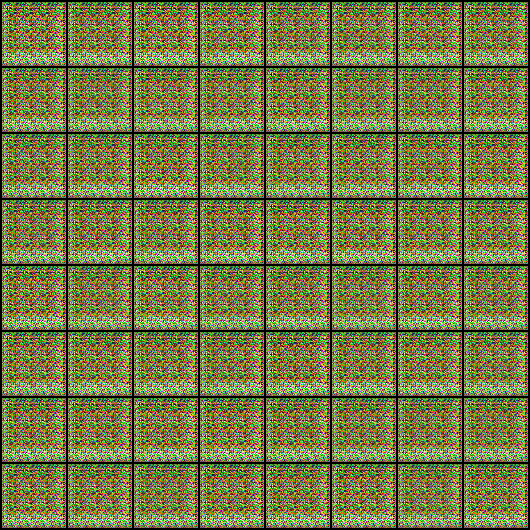

In [53]:
Image('./generated/generated-images-0001.png')

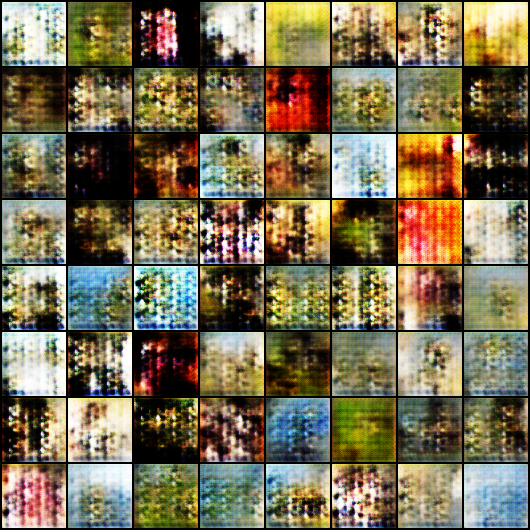

In [54]:
Image('./generated/generated-images-0024.png')

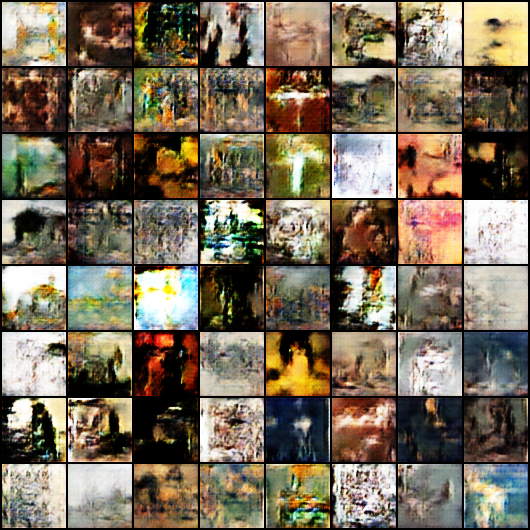

In [55]:
Image('./generated/generated-images-0066.png')

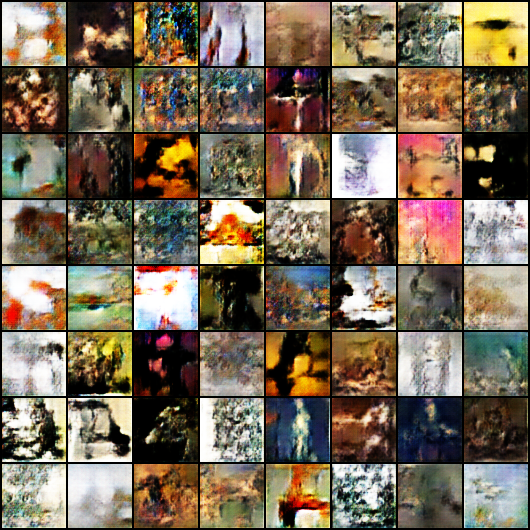

In [57]:
Image('./generated/generated-images-0085.png')

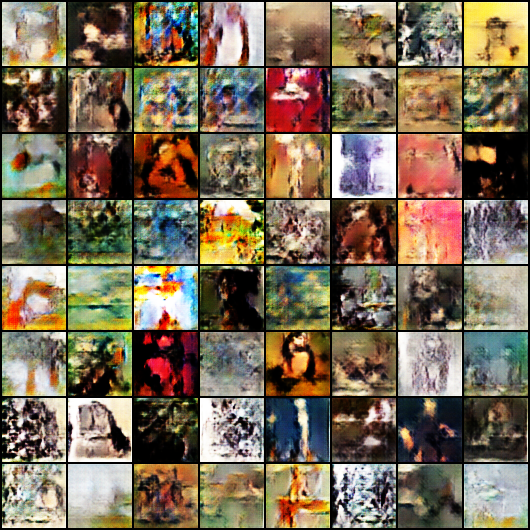

In [58]:
Image('./generated/generated-images-0098.png')

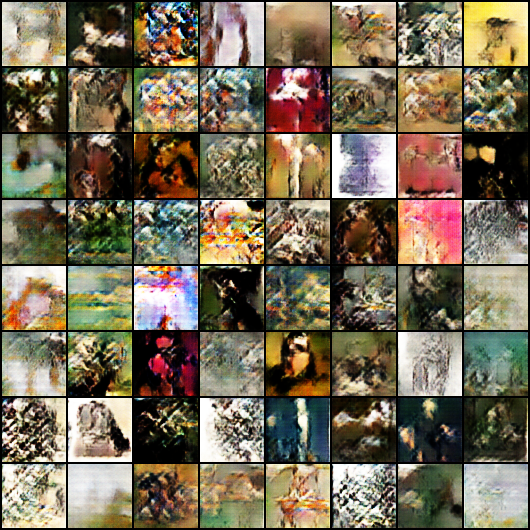

In [59]:
Image('./generated/generated-images-0099.png')

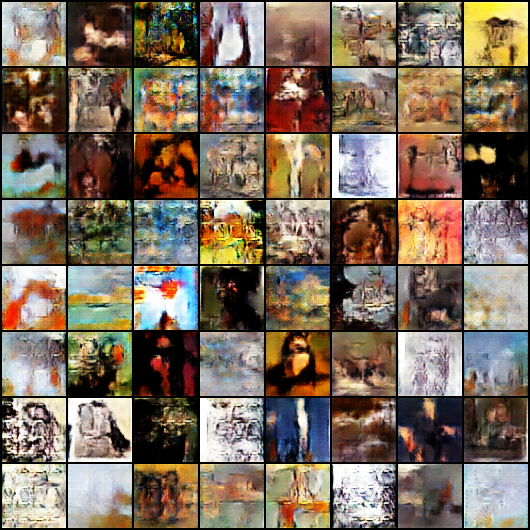

In [60]:
Image('./generated/generated-images-0100.png')

#Results
1. Make a video on generative pictures.
2. Graphs

In [61]:
import cv2
import os

vid_fname = 'art_gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 5, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

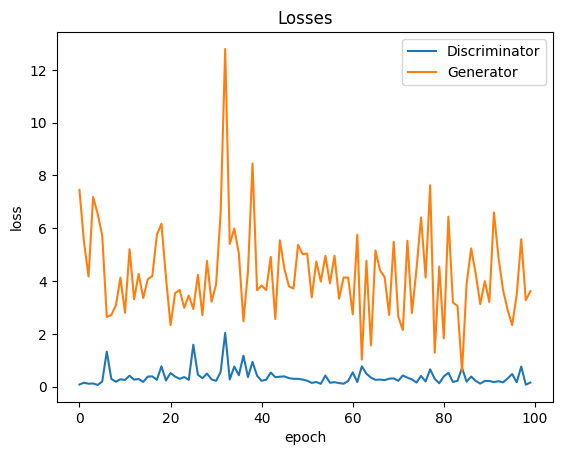

In [62]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

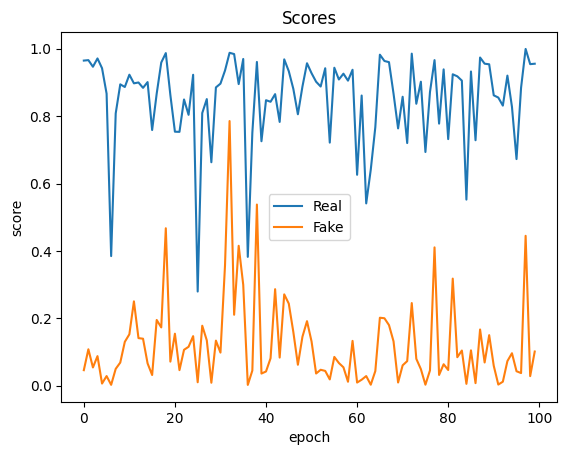

In [63]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

#Conclusion
Experimenting with different values for learning rate and number of epochs can generate high quality images and accurate prediction values.

